![banner cnns ppgcc ufsc](http://www.lapix.ufsc.br/wp-content/uploads/2019/04/VC2.png)

# Bilateral filtering


**Bilateral Filtering** (BF) is a filter that acts similarly to the *Anisotropic Diffusion Filter* (ADF), blurring plateaus in the gradient landscape (regions where the image does not change much), while maintaining differences where the gradients are high. It takes one Gaussian filter in space and one more Gaussian filter which is a function of pixel difference. It is faster than an ADF, but its results are not so good. As does the ADF, the BF can be used to perform a pre-segmentation to an image, leaving it better to segment afterwards.

The Gaussian function of space makes sure that only nearby pixels are considered for blurring,  while the Gaussian function of intensity difference makes sure that only those pixels with  similar intensities to the central pixel are considered for blurring.  

So it preserves the edges since pixels at edges will have large intensity variation.

Related works:
https://www.researchgate.net/publication/262567850_Nova_metodologia_para_a_estimativa_da_cobertura_de_nuvens

In [1]:
# Import standard libraries
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
# To be able to create true copies of images
import copy

In [5]:
# Carregar imagem OpenCV BGR
filename = '2021-03-31-14-57.jpg'
img_bgr = cv.imread('data/nuvens/' + filename)
# Transformar em RGB
img = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

In [7]:
# Show results
def showResults(img, blur):
    fig, axes = plt.subplots(nrows = 2,ncols=1, figsize=(20,30), sharex=True, sharey=True)
    ax = axes.ravel()
    ax[0].imshow(img)
    ax[0].set_title('Original image')
    ax[1].imshow(blur)
    ax[1].set_title('Filtered')
    for a in ax:
        a.axis('off')
    fig.tight_layout()
    plt.show()

In [12]:
# Save results
def saveResults(resultFilename, resultImage_BGR):
    resultPath = 'data/nuvens/resultados/'
    # Convert image back to standard OpenCV format
    resultImage = cv.cvtColor(resultImage_BGR, cv.COLOR_RGB2BGR)
    cv.imwrite(resultPath + resultFilename, resultImage)

## Filtragem One-Shot

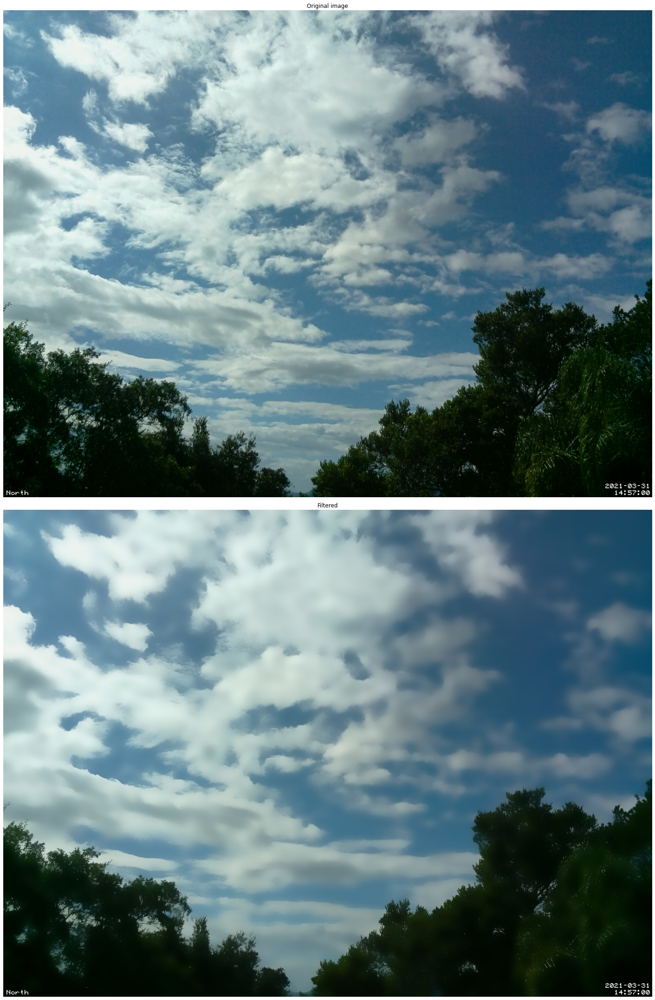

In [13]:
# Filtrar!
# Parâmetros originais
# blur = cv.bilateralFilter(img,9,75,75)
# blur = cv.bilateralFilter(<image>,<iterations>,<color radius>,<gradient radius>)
# Para comparar: 
# blur = cv.blur(img,(5,5))
# 500 iterações, raio = 60 pixels
blur = cv.bilateralFilter(img,50,90,90)
showResults(img, blur)
saveResults('result-'+filename, blur)


## Filtragem Iterativa

### Raio Crescente

Iterating for radius = 10
Iterating for radius = 20
Iterating for radius = 30
Iterating for radius = 40
Iterating for radius = 50
Iterating for radius = 60
Iterating for radius = 70
Iterating for radius = 80
Iterating for radius = 90


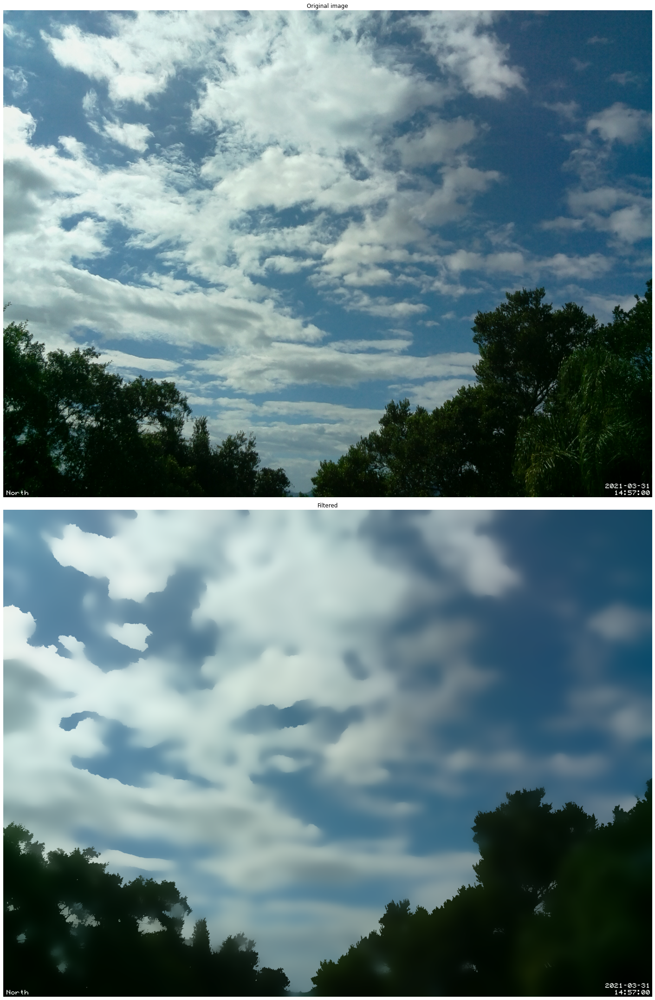

In [15]:
# Filtrar iterativamente com raio crescente
# blur = cv.bilateralFilter(<image>,<iterations>,<color radius>,<gradient radius>)
# 
inputImg = copy.deepcopy(img)
mult = 10
for x in range(1, 10):
    print('Iterating for radius =', x * mult)
    blur = cv.bilateralFilter(inputImg,40,x * mult,x * mult)
    inputImg = copy.deepcopy(blur)
showResults(img, blur)
saveResults('result-radius-10-100-iter-40-'+filename, blur)

### Raio Decrescente

Iterating for radius = 100
Iterating for radius = 50
Iterating for radius = 25
Iterating for radius = 12
Iterating for radius = 6


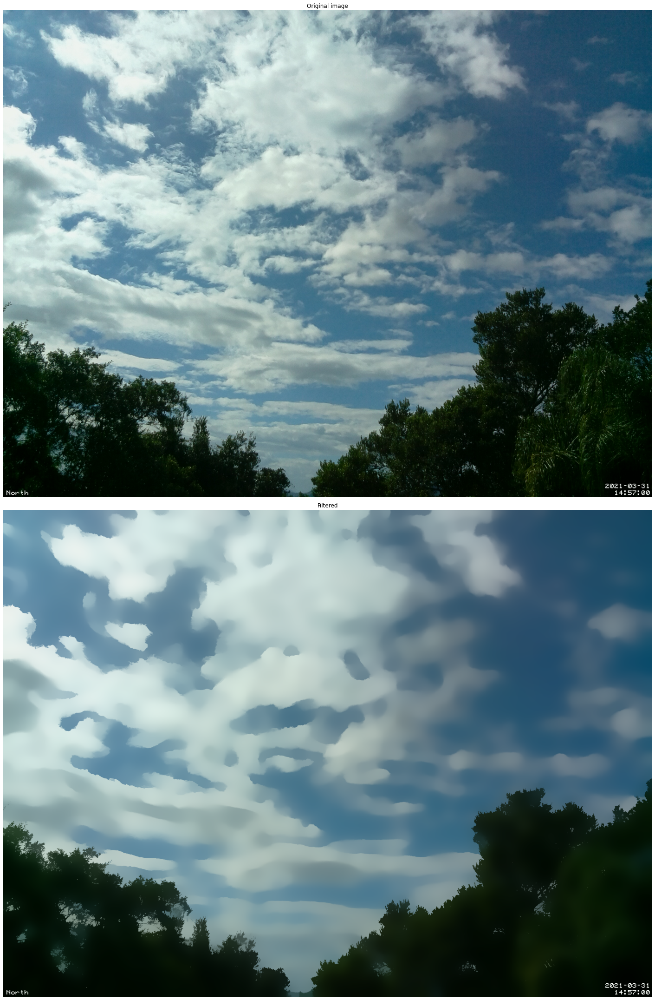

In [16]:
# Filtrar iterativamente com raio DECRESCENTE
# blur = cv.bilateralFilter(<image>,<iterations>,<color radius>,<gradient radius>)
# 
inputImg = copy.deepcopy(img)
mult = 100
for x in range(6, 1, -1):
    print('Iterating for radius =', mult)
    blur = cv.bilateralFilter(inputImg,50, mult, mult)
    mult = mult // 2
    inputImg = copy.deepcopy(blur)
showResults(img, blur)
saveResults('result-decrease'+filename, blur)

Iterating for radius = 100  and iterations =  20
Iterating for radius = 50  and iterations =  40
Iterating for radius = 25  and iterations =  80
Iterating for radius = 12  and iterations =  160
Iterating for radius = 6  and iterations =  320


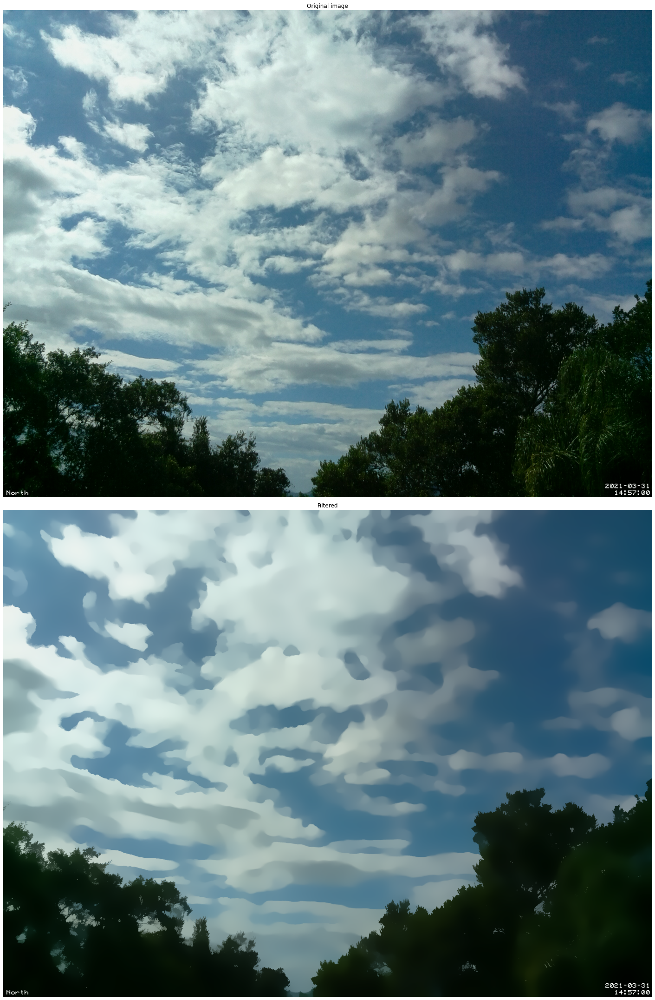

In [19]:
# Filtrar iterativamente com raio DECRESCENTE
# blur = cv.bilateralFilter(<image>,<iterations>,<color radius>,<gradient radius>)
# 
inputImg = copy.deepcopy(img)
mult = 100
iterations = 20
for x in range(6, 1, -1):
    print('Iterating for radius =', mult, ' and iterations = ', iterations)
    blur = cv.bilateralFilter(inputImg,iterations, mult, mult)
    mult = mult // 2
    iterations = iterations * 2
    inputImg = copy.deepcopy(blur)
showResults(img, blur)
saveResults('result-double-parameters-100-20-'+filename, blur)